# **Mount Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Importing Libraries**

In [2]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import numpy as np
import cv2
from glob import glob
from sklearn.utils import shuffle
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Recall, Precision, BinaryAccuracy, AUC

In [3]:
# Seeding
np.random.seed(42)
tf.random.set_seed(42)

In [4]:
data_path = "/content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE"

# **Thin Data Loading**

In [5]:
!python thin_thick.py "{data_path}/training/mask"

[INFO] Input Data Directory: /content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE/training/mask
21_manual1.gif: thin px=6024, thick px=18012, diam_thr=2.00, min_len=49, ecc_thr=0.99, size_thr=12
22_manual1.gif: thin px=7836, thick px=21220, diam_thr=2.00, min_len=59, ecc_thr=0.99, size_thr=14
23_manual1.gif: thin px=11726, thick px=8610, diam_thr=4.00, min_len=43, ecc_thr=0.99, size_thr=10
24_manual1.gif: thin px=5904, thick px=31634, diam_thr=2.00, min_len=76, ecc_thr=0.99, size_thr=19
25_manual1.gif: thin px=5150, thick px=26179, diam_thr=2.00, min_len=63, ecc_thr=0.99, size_thr=15
26_manual1.gif: thin px=4545, thick px=22428, diam_thr=2.00, min_len=55, ecc_thr=0.99, size_thr=13
27_manual1.gif: thin px=6769, thick px=21503, diam_thr=2.00, min_len=58, ecc_thr=0.99, size_thr=14
28_manual1.gif: thin px=7179, thick px=24302, diam_thr=2.00, min_len=64, ecc_thr=0.99, size_thr=16
29_manual1.gif: thin px=6493, thick px=20816, diam_thr=2.00, min_len=55, ecc_thr=0.99, size_thr=13
30_manual1.gif:

In [6]:
!python thin_thick.py "{data_path}/test/mask"

[INFO] Input Data Directory: /content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE/test/mask
01_manual1.gif: thin px=5936, thick px=22732, diam_thr=2.00, min_len=58, ecc_thr=0.99, size_thr=14
02_manual1.gif: thin px=5464, thick px=27957, diam_thr=2.00, min_len=67, ecc_thr=0.99, size_thr=16
03_manual1.gif: thin px=6621, thick px=25808, diam_thr=2.00, min_len=65, ecc_thr=0.99, size_thr=16
04_manual1.gif: thin px=6337, thick px=23558, diam_thr=2.00, min_len=60, ecc_thr=0.99, size_thr=15
05_manual1.gif: thin px=6240, thick px=24109, diam_thr=2.00, min_len=61, ecc_thr=0.99, size_thr=15
06_manual1.gif: thin px=6945, thick px=24443, diam_thr=2.00, min_len=64, ecc_thr=0.99, size_thr=16
07_manual1.gif: thin px=5595, thick px=23902, diam_thr=2.00, min_len=60, ecc_thr=0.99, size_thr=15
08_manual1.gif: thin px=5285, thick px=22833, diam_thr=2.00, min_len=56, ecc_thr=0.99, size_thr=14
09_manual1.gif: thin px=6344, thick px=19896, diam_thr=2.00, min_len=53, ecc_thr=0.99, size_thr=13
10_manual1.gif: thi

## **Thin Data Augmentation**

In [7]:
import importlib
import data
importlib.reload(data)
from data import load_data, create_dir, augment_data, load_folder, shuffling, tf_dataset

In [8]:
train_x_path = data_path + "/training/images/*.tif"
train_y_path = "./thin_vessels/train/*.png"
test_x_path = data_path + "/test/images/*.tif"
test_y_path = "thin_vessels/test/*.png"

In [9]:
train_x = load_folder(train_x_path)
train_y = load_folder(train_y_path)
test_x = load_folder(test_x_path)
test_y = load_folder(test_y_path)

In [10]:
print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Test:  {len(test_x)} - {len(test_y)}")

Train: 20 - 20
Test:  20 - 20


In [11]:
augment_data(train_x, train_y, "new_thin_data/train/", augment=True)
augment_data(test_x, test_y, "new_thin_data/test/", augment=False)

100%|██████████| 20/20 [00:33<00:00,  1.66s/it]


# **Thin Augmented Data Loading**

In [12]:
(train_x, train_y), (test_x, test_y) = load_data("new_thin_data", augmented=True)
print(f"Augmented Train: {len(train_x)} - {len(train_y)}")
print(f"Augmented Test:  {len(test_x)} - {len(test_y)}")

Augmented Train: 120 - 120
Augmented Test:  20 - 20


In [13]:
train_x, train_y = shuffling(train_x, train_y)

# **Validation Split**

In [14]:
from sklearn.model_selection import train_test_split

In [15]:
train_x, valid_x, train_y, valid_y = train_test_split(train_x, train_y, test_size=0.1, random_state=42)

print(f"Train after split: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")

Train after split: 108 - 108
Valid: 12 - 12


In [16]:
""" Directory to save files """
create_dir("files_thin_model")

In [25]:
H = 512
W = 512

In [54]:
""" Hyperparameters """
batch_size = 2
lr = 1e-4
num_epochs = 70
model_path = os.path.join("files_thin_model", "thin_model.keras")
csv_path = os.path.join("files_thin_model", "data.csv")

In [55]:
""" Dataset """
dataset_path = "new_thin_data"

In [56]:
train_dataset = tf_dataset(train_x, train_y, batch_size)
valid_dataset = tf_dataset(valid_x, valid_y, batch_size)
test_dataset = tf_dataset(test_x, test_y, batch_size)

In [57]:
train_steps = len(train_x) // batch_size
valid_steps = len(valid_x) // batch_size

In [58]:
if len(train_x) % batch_size != 0:
    train_steps += 1
if len(valid_x) % batch_size != 0:
    valid_steps += 1

In [59]:
import metrics
importlib.reload(metrics)

from metrics import dice_coef, dice_loss, combined_loss, iou

# **Model**

In [60]:
import model
importlib.reload(model)

from model import build_unet

In [61]:
model = build_unet((H, W, 3))

In [91]:
# !pip install -q segmentation-models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.7 MB/s eta 0:00:00


In [93]:
# import os
# os.environ['SM_FRAMEWORK'] = 'tf.keras'  # use TensorFlow Keras
# import segmentation_models as sm

# # Now define the model
# BACKBONE = 'resnet34'
# model = sm.Unet(
#     BACKBONE,
#     encoder_weights='imagenet',
#     input_shape=(512, 512, 3),
#     classes=1,
#     activation='sigmoid',
# )


Segmentation Models: using `tf.keras` framework.
85521592/85521592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [62]:
model.compile(
    loss=combined_loss,
    optimizer=Adam(lr),
    metrics=[
        dice_coef,
        iou,
        Recall(name="recall"),
        Precision(name="precision"),
        BinaryAccuracy(name="accuracy"),
        AUC(name="auc"),
    ]
)

In [63]:
callbacks = [
    ModelCheckpoint(model_path, save_best_only=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, min_lr=1e-6, verbose=1),
    CSVLogger(csv_path),
    TensorBoard(),
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
]

In [64]:
model.fit(
    train_dataset,
    epochs=num_epochs,
    validation_data=valid_dataset,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks
)

Epoch 1/70
54/54 ━━━━━━━━━━━━━━━━━━━━ 108s 707ms/step - accuracy: 0.7510 - auc: 0.5934 - dice_coef: 0.0462 - iou: 0.0212 - loss: 3.0188 - precision: 0.0273 - recall: 0.2885 - val_accuracy: 0.9745 - val_auc: 0.3954 - val_dice_coef: 0.0469 - val_iou: 1.7038e-11 - val_loss: 2.8818 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/70
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 600ms/step - accuracy: 0.9778 - auc: 0.7895 - dice_coef: 0.0525 - iou: 0.0021 - loss: 2.5339 - precision: 0.0618 - recall: 0.0021 - val_accuracy: 0.9745 - val_auc: 0.4692 - val_dice_coef: 0.0453 - val_iou: 1.7038e-11 - val_loss: 2.6231 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/70
54/54 ━━━━━━━━━━━━━━━━━━━━ 29s 545ms/step - accuracy: 0.9746 - auc: 0.8524 - dice_coef: 0.0691 - iou: 0.0211 - loss: 2.4210 - precision: 0.1169 - recall: 0.0317 - val_accuracy: 0.9745 - val_auc: 0.4933 - val_dice_coef: 0.0416 - val_iou: 1.7038e-11 - val_loss: 2.4693 - v

# **Storing The Performance Score In CSV**

In [96]:
from tensorflow.keras.utils import CustomObjectScope
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
import pandas as pd
from tqdm import tqdm

In [97]:
def read_image(path):
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    ori_x = x.copy()
    x = x / 255.0
    x = x.astype(np.float32)
    return ori_x, x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    ori_x = x.copy()
    x = x / 255.0
    x = x.astype(np.int32)
    return ori_x, x

def save_results(ori_x, ori_y, y_pred, save_image_path):
    line = np.ones((H, 10, 3)) * 255

    ori_y = np.expand_dims(ori_y, axis=-1)
    ori_y = np.concatenate([ori_y]*3, axis=-1)

    y_pred = np.expand_dims(y_pred, axis=-1)
    y_pred = np.concatenate([y_pred]*3, axis=-1) * 255

    cat_images = np.concatenate([ori_x, line, ori_y, line, y_pred], axis=1)
    cv2.imwrite(save_image_path, cat_images)

In [98]:
os.makedirs("thin_predictions", exist_ok=True)
os.makedirs("thick_predictions", exist_ok=True)
os.makedirs("combined_predictions", exist_ok=True)

In [99]:
height, width = 512, 512

In [100]:
""" Save the results in this folder """
create_dir("thin_results")

""" Load the model (corrected model path and extension) """
with CustomObjectScope({'iou': iou, 'dice_coef': dice_coef, 'dice_loss': dice_loss, 'combined_loss': combined_loss}):
    model = tf.keras.models.load_model("./files_thin_model/thin_model.keras")

""" Prediction and evaluation """
SCORE = []
for x_path, y_path in tqdm(zip(test_x, test_y), total=len(test_x)):
    name = os.path.basename(x_path).split(".")[0]

    ori_x, x = read_image(x_path)
    ori_y, y = read_mask(y_path)

    y_pred = model.predict(np.expand_dims(x, axis=0), verbose=0)[0]
    y_pred = (y_pred > 0.5).astype(np.int32)
    y_pred = np.squeeze(y_pred, axis=-1)

    ##########
    thin_pred = y_pred.astype(np.uint8)
    cv2.imwrite(f"thin_predictions/{name}.png", thin_pred * 255)
    ##########

    save_image_path = f"thin_results/{name}.png"
    save_results(ori_x, ori_y, y_pred, save_image_path)

    y = y.flatten()
    y_pred = y_pred.flatten()

    acc = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    jac = jaccard_score(y, y_pred)
    recall = recall_score(y, y_pred)
    precision = precision_score(y, y_pred)

    # Before computing loss, reshape y and y_pred, according to cobined loss structure
    y_for_comb_loss = tf.convert_to_tensor(y.reshape(1, height, width, 1), dtype=tf.float32)
    y_pred_for_comb_loss = tf.convert_to_tensor(y_pred.reshape(1, height, width, 1), dtype=tf.float32)

    COMBINED_LOSS = combined_loss(y_for_comb_loss, y_pred_for_comb_loss).numpy().item()

    SCORE.append([name, acc, f1, jac, recall, precision, COMBINED_LOSS])

score = np.mean([s[1:] for s in SCORE], axis=0)
print(f"Accuracy: {score[0]:0.5f}")
print(f"F1: {score[1]:0.5f}")
print(f"Jaccard: {score[2]:0.5f}")
print(f"Recall: {score[3]:0.5f}")
print(f"Precision: {score[4]:0.5f}")
print(f"combined_loss: {score[5]:0.5f}")

df = pd.DataFrame(SCORE, columns=["Image", "Acc", "F1", "Jaccard", "Recall", "Precision", "Combined_Loss"])
df.to_csv("./files_thin_model/score.csv", index=False)

100%|██████████| 20/20 [00:09<00:00,  2.20it/s]

Accuracy: 0.91712
F1: 0.20821
Jaccard: 0.11658
Recall: 0.12491
Precision: 0.63480
combined_loss: 3.12655


In [70]:
# Zip the CSV file and folders
!zip -r thin_outputs.zip /content/files_thin_model thin_results
from google.colab import files
files.download("thin_outputs.zip")

  adding: content/files_thin_model/ (stored 0%)
  adding: content/files_thin_model/data.csv (deflated 55%)
  adding: content/files_thin_model/thin_model.keras (deflated 9%)
  adding: content/files_thin_model/score.csv (deflated 50%)
  adding: thin_results/ (stored 0%)
  adding: thin_results/10_test.png (deflated 2%)
  adding: thin_results/12_test.png (deflated 2%)
  adding: thin_results/02_test.png (deflated 2%)
  adding: thin_results/06_test.png (deflated 2%)
  adding: thin_results/15_test.png (deflated 2%)
  adding: thin_results/17_test.png (deflated 2%)
  adding: thin_results/05_test.png (deflated 2%)
  adding: thin_results/20_test.png (deflated 2%)
  adding: thin_results/16_test.png (deflated 2%)
  adding: thin_results/08_test.png (deflated 2%)
  adding: thin_results/04_test.png (deflated 2%)
  adding: thin_results/14_test.png (deflated 2%)
  adding: thin_results/11_test.png (deflated 2%)
  adding: thin_results/18_test.png (deflated 2%)
  adding: thin_results/03_test.png (deflated 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [71]:
!ls "{data_path}"

test  training	U_Net_model.keras


# Thick

In [72]:
!python data.py "/content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE/"

2025-06-15 03:50:15.539969: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749959415.563409   26525 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749959415.570258   26525 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
[INFO] Using custom data path: /content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE/
Train: 20 - 20
Test: 20 - 20
100% 20/20 [00:04<00:00,  4.04it/s]
100% 20/20 [00:01<00:00, 17.44it/s]


In [73]:
train_x_path = "/content/new_data/train/image/*.png"
train_y_path = "/content/new_data/train/mask/*.png"
test_x_path = "/content/new_data/test/image/*.png"
test_y_path = "/content/new_data/test/mask/*.png"

In [74]:
train_x = load_folder(train_x_path)
train_y = load_folder(train_y_path)
test_x = load_folder(test_x_path)
test_y = load_folder(test_y_path)

In [75]:
train_x, train_y = shuffling(train_x, train_y)

train_x, valid_x, train_y, valid_y = train_test_split(train_x, train_y, test_size=0.1, random_state=42)

print(f"Train after split: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")

Train after split: 108 - 108
Valid: 12 - 12


In [76]:
# Path to thick vessel model
thick_model_path = os.path.join(data_path, "U_Net_model.keras")

# Save the results in this folder
create_dir("thick_results")

# Load the model
with CustomObjectScope({'iou': iou, 'dice_coef': dice_coef, 'dice_loss': dice_loss, 'combined_loss': combined_loss}):
    thick_model = tf.keras.models.load_model(thick_model_path)

# Prediction and evaluation
THICK_SCORE = []
for x_path, y_path in tqdm(zip(test_x, test_y), total=len(test_x)):
    name = os.path.basename(x_path).split(".")[0]

    ori_x, x = read_image(x_path)
    ori_y, y = read_mask(y_path)

    y_pred = thick_model.predict(np.expand_dims(x, axis=0), verbose=0)[0]
    y_pred = (y_pred > 0.5).astype(np.int32)
    y_pred = np.squeeze(y_pred, axis=-1)

    ############
    thick_pred = y_pred.astype(np.uint8)
    cv2.imwrite(f"thick_predictions/{name}.png", thick_pred * 255)
    ############

    save_image_path = f"thick_results/{name}.png"
    save_results(ori_x, ori_y, y_pred, save_image_path)

    y = y.flatten()
    y_pred = y_pred.flatten()

    acc = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    jac = jaccard_score(y, y_pred)
    recall = recall_score(y, y_pred)
    precision = precision_score(y, y_pred)

    y_for_comb_loss = tf.convert_to_tensor(y.reshape(1, height, width, 1), dtype=tf.float32)
    y_pred_for_comb_loss = tf.convert_to_tensor(y_pred.reshape(1, height, width, 1), dtype=tf.float32)
    COMBINED_LOSS = combined_loss(y_for_comb_loss, y_pred_for_comb_loss).numpy().item()

    THICK_SCORE.append([name, acc, f1, jac, recall, precision, COMBINED_LOSS])

# Save performance
score = np.mean([s[1:] for s in THICK_SCORE], axis=0)
print(f"[Thick] Accuracy: {score[0]:0.5f}")
print(f"[Thick] F1: {score[1]:0.5f}")
print(f"[Thick] Jaccard: {score[2]:0.5f}")
print(f"[Thick] Recall: {score[3]:0.5f}")
print(f"[Thick] Precision: {score[4]:0.5f}")
print(f"[Thick] Combined Loss: {score[5]:0.5f}")

# Save to CSV
df = pd.DataFrame(THICK_SCORE, columns=["Image", "Acc", "F1", "Jaccard", "Recall", "Precision", "Combined_Loss"])
df.to_csv("./files_thin_model/thick_score.csv", index=False)

100%|██████████| 20/20 [00:08<00:00,  2.31it/s]

[Thick] Accuracy: 0.95431
[Thick] F1: 0.72866
[Thick] Jaccard: 0.57359
[Thick] Recall: 0.70487
[Thick] Precision: 0.75880
[Thick] Combined Loss: 2.00414


In [78]:
# Zip results
!zip -r thin_thick_prediction.zip thick_predictions, thin_predictions
from google.colab import files
files.download("thin_thick_prediction.zip")


	zip warning: name not matched: thick_predictions,
  adding: thin_predictions/ (stored 0%)
  adding: thin_predictions/10_test.png (deflated 15%)
  adding: thin_predictions/12_test.png (deflated 13%)
  adding: thin_predictions/02_test.png (deflated 14%)
  adding: thin_predictions/06_test.png (deflated 13%)
  adding: thin_predictions/15_test.png (deflated 11%)
  adding: thin_predictions/17_test.png (deflated 12%)
  adding: thin_predictions/05_test.png (deflated 12%)
  adding: thin_predictions/20_test.png (deflated 13%)
  adding: thin_predictions/16_test.png (deflated 14%)
  adding: thin_predictions/08_test.png (deflated 14%)
  adding: thin_predictions/04_test.png (deflated 13%)
  adding: thin_predictions/14_test.png (deflated 15%)
  adding: thin_predictions/11_test.png (deflated 13%)
  adding: thin_predictions/18_test.png (deflated 12%)
  adding: thin_predictions/03_test.png (deflated 13%)
  adding: thin_predictions/01_test.png (deflated 14%)
  adding: thin_predictions/19_test.png (defla

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# TEMP

In [83]:
# fusion_simple.py

import os
import numpy as np
import cv2
from glob import glob
import tensorflow as tf
from tensorflow.keras.utils import CustomObjectScope

from metrics import dice_loss, dice_coef, iou, combined_loss, soft_cldice_loss

# Constants
H, W = 512, 512
DEFAULT_THRESHOLD = 0.5

# Paths
data_dir = "/content/new_data/test"#'/content/thin_predictions'  # contains image/ subfolder
thin_model_path = '/content/files_thin_model/thin_model.keras'
thick_model_path = '/content/drive/MyDrive/Datasets/DRIVE_Shared/DRIVE/U_Net_model.keras'
output_dir = 'fused_results'
threshold = DEFAULT_THRESHOLD

def create_dir(path):
    os.makedirs(path, exist_ok=True)

def read_image(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {path}")
    img = cv2.resize(img, (W, H))
    return img

def preprocess(img):
    return img.astype(np.float32) / 255.0

def binarize_mask(prob_map, threshold):
    return ((prob_map > threshold).astype(np.uint8)) * 255

def main():
    create_dir(output_dir)

    with CustomObjectScope({
        'dice_loss': dice_loss,
        'dice_coef': dice_coef,
        'iou': iou,
        'combined_loss': combined_loss,
        'soft_cldice_loss': soft_cldice_loss()
    }):
        thin_model = tf.keras.models.load_model(thin_model_path, compile=False)
        thick_model = tf.keras.models.load_model(thick_model_path, compile=False)

    img_paths = sorted(glob(os.path.join(data_dir, 'image', '*.png')))
    if not img_paths:
        print(f"No images found in {data_dir}/image")
        return

    for img_path in img_paths:
        name = os.path.splitext(os.path.basename(img_path))[0]
        ori = read_image(img_path)
        x_in = preprocess(ori)

        thin_prob = thin_model.predict(x_in[None, ...])[0, ..., 0]
        thin_mask = binarize_mask(thin_prob, threshold)

        thick_prob = thick_model.predict(x_in[None, ...])[0, ..., 0]
        thick_mask = binarize_mask(thick_prob, threshold)

        combined = ((thin_mask > 0) | (thick_mask > 0)).astype(np.uint8) * 255

        out_path = os.path.join(output_dir, f"{name}_fused.png")
        cv2.imwrite(out_path, combined)
        print(f"Saved fused mask: {out_path}")


In [84]:
main()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 63s 63s/step
Saved fused mask: fused_results/01_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
Saved fused mask: fused_results/02_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
Saved fused mask: fused_results/03_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Saved fused mask: fused_results/04_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
Saved fused mask: fused_results/05_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Saved fused mask: fused_results/06_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
Saved fused mask: fused_results/07_test_fused.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Saved fused mask: fused_result

In [85]:
# Zip results
!zip -r fused_results.zip /content/fused_results
from google.colab import files
files.download("fused_results.zip")


  adding: content/fused_results/ (stored 0%)
  adding: content/fused_results/20_test_fused.png (deflated 13%)
  adding: content/fused_results/12_test_fused.png (deflated 13%)
  adding: content/fused_results/18_test_fused.png (deflated 12%)
  adding: content/fused_results/13_test_fused.png (deflated 14%)
  adding: content/fused_results/16_test_fused.png (deflated 14%)
  adding: content/fused_results/09_test_fused.png (deflated 13%)
  adding: content/fused_results/01_test_fused.png (deflated 13%)
  adding: content/fused_results/06_test_fused.png (deflated 13%)
  adding: content/fused_results/15_test_fused.png (deflated 13%)
  adding: content/fused_results/04_test_fused.png (deflated 13%)
  adding: content/fused_results/07_test_fused.png (deflated 12%)
  adding: content/fused_results/19_test_fused.png (deflated 13%)
  adding: content/fused_results/17_test_fused.png (deflated 12%)
  adding: content/fused_results/02_test_fused.png (deflated 14%)
  adding: content/fused_results/10_test_fused

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [86]:
from PIL import Image
import os
from glob import glob

# Directory containing PNG images
img_dir = '/content/fused_results'

# Get all PNG files
img_paths = sorted(glob(os.path.join(img_dir, '*.png')))

# Check if images are found
if not img_paths:
    print("No PNG images found.")
else:
    # Open and convert images to RGB
    img_list = []
    for path in img_paths:
        img = Image.open(path).convert('RGB')
        img_list.append(img)

    # Save all images into a single PDF
    output_pdf_path = os.path.join(img_dir, 'fused_output.pdf')
    img_list[0].save(output_pdf_path, save_all=True, append_images=img_list[1:])
    print(f"PDF saved to: {output_pdf_path}")


PDF saved to: /content/fused_results/fused_output.pdf


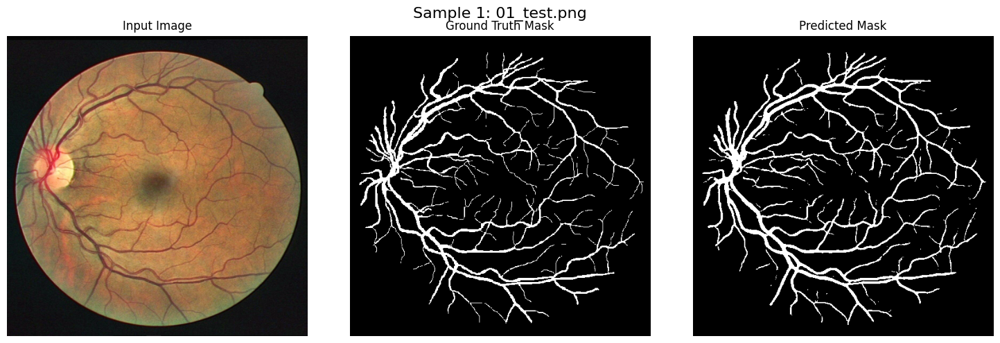

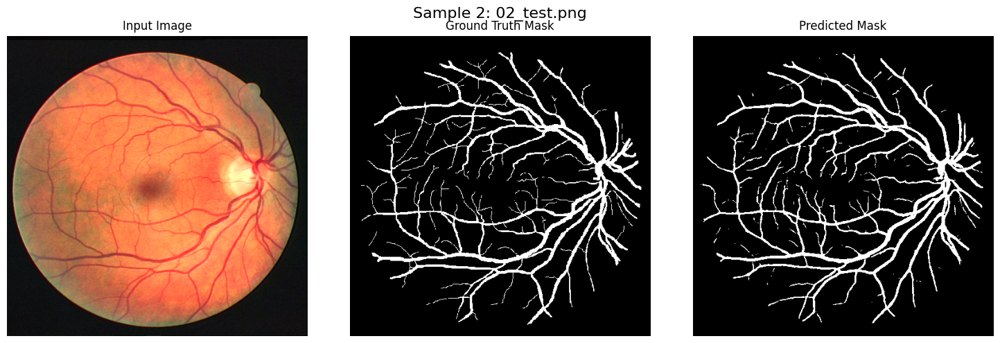

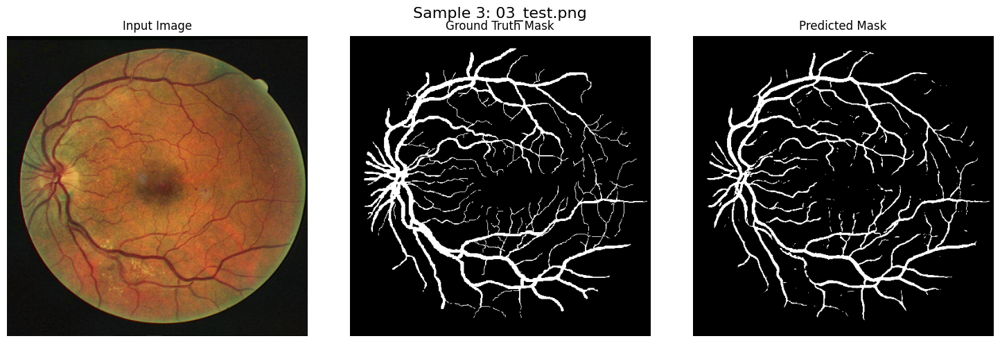

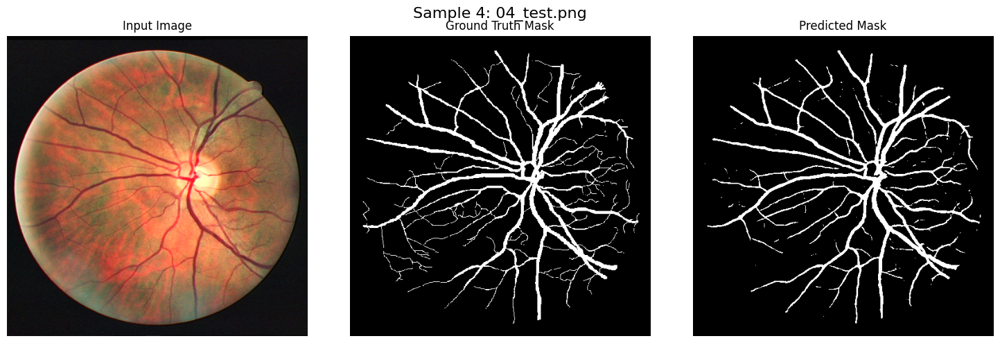

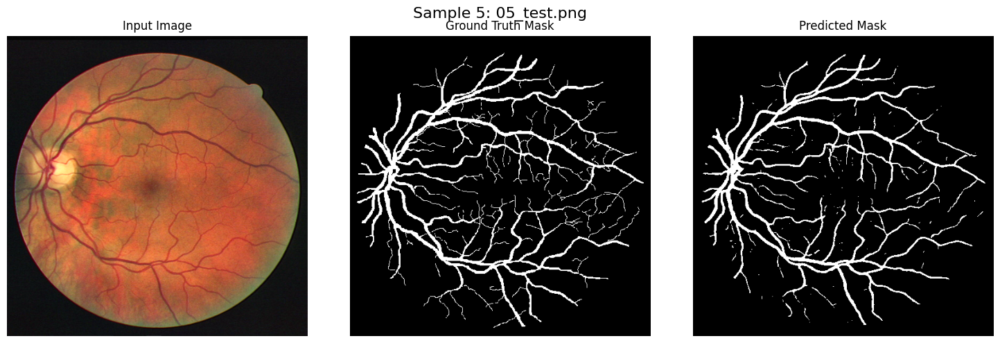

...

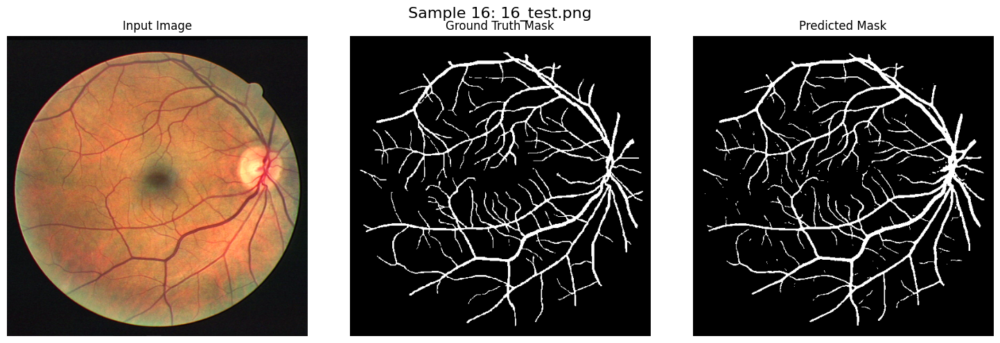

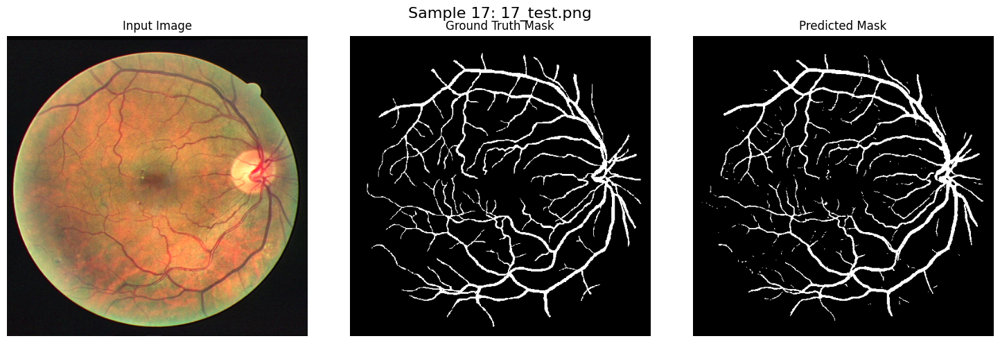

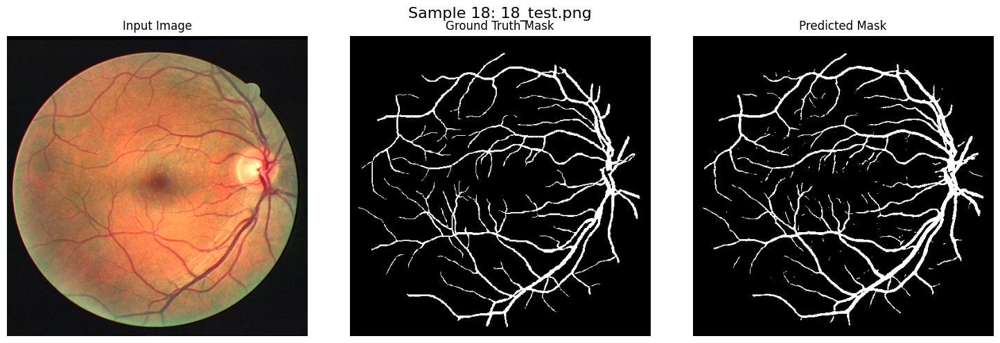

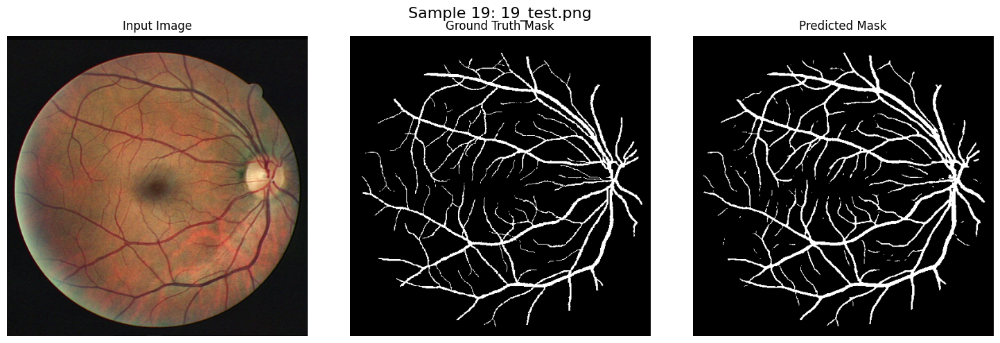

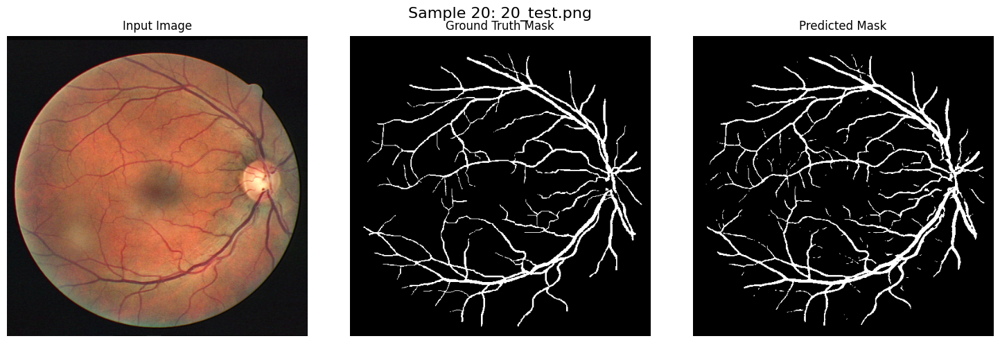

In [89]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define directories
image_dir = '/content/new_data/test/image'
gt_dir = '/content/new_data/test/mask'
pred_dir = '/content/fused_results'

# List of filenames (assumes all sets have matching filenames)
image_filenames = sorted(os.listdir(image_dir))

# Number of samples to show (change this as needed)
num_samples = 20

# Plot the images
for i in range(num_samples):
    filename = image_filenames[i]

    image_path = os.path.join(image_dir, filename)
    gt_path = os.path.join(gt_dir, filename)
    pred_path = os.path.join(pred_dir, filename)

    # Open images
    image = Image.open(image_path).convert('RGB')
    gt_mask = Image.open(gt_path).convert('L')
    fused_pred_path = os.path.join(pred_dir, f"{os.path.splitext(filename)[0]}_fused.png")
    pred_mask = Image.open(fused_pred_path).convert('L')

    # Display them
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Sample {i + 1}: {filename}", fontsize=16)

    axes[0].imshow(image)
    axes[0].set_title("Input Image")
    axes[0].axis('off')

    axes[1].imshow(gt_mask, cmap='gray')
    axes[1].set_title("Ground Truth Mask")
    axes[1].axis('off')

    axes[2].imshow(pred_mask, cmap='gray')
    axes[2].set_title("Predicted Mask")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()
